In [1]:
!pip install nbformat


[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Segments shape: (50960, 29)
   segment_id  start_lat   start_lon    end_lat     end_lon  \
0           0  37.781548 -122.157357  37.784847 -122.162367   
1           1  37.784847 -122.162367  37.785793 -122.163060   
2           2  37.785793 -122.163060  37.786693 -122.166510   
3           3  37.786693 -122.166510  37.786969 -122.167616   
4           4  37.786969 -122.167616  37.787504 -122.168036   

                   start_time                    end_time  start_elevation_m  \
0         2024-01-01T11:00:00  2024-01-01T11:00:53.337942         235.323777   
1  2024-01-01T11:00:53.337942  2024-01-01T11:01:04.750856         221.561660   
2  2024-01-01T11:01:04.750856  2024-01-01T11:01:34.432675         204.075374   
3  2024-01-01T11:01:34.432675  2024-01-01T11:01:43.637267         200.522503   
4  2024-01-01T11:01:43.637267  2024-01-01T11:01:49.316282         204.392133   

   end_elevation_m  start_speed_kmh  ...  energy_hvac_kwh  \
0       221.561660        38.792436  ...         0.

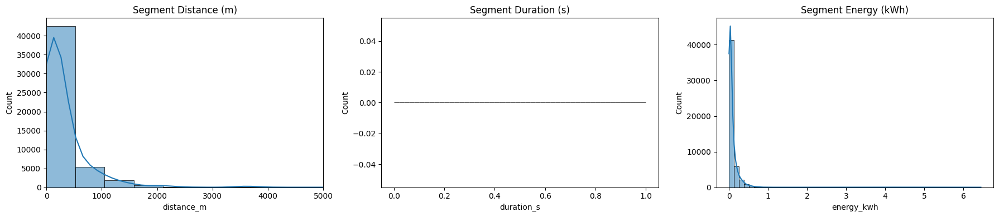


--- Vehicle & Trip Analysis ---
Unique vehicles: 30
Unique trips: 542



--- Spatial Analysis ---


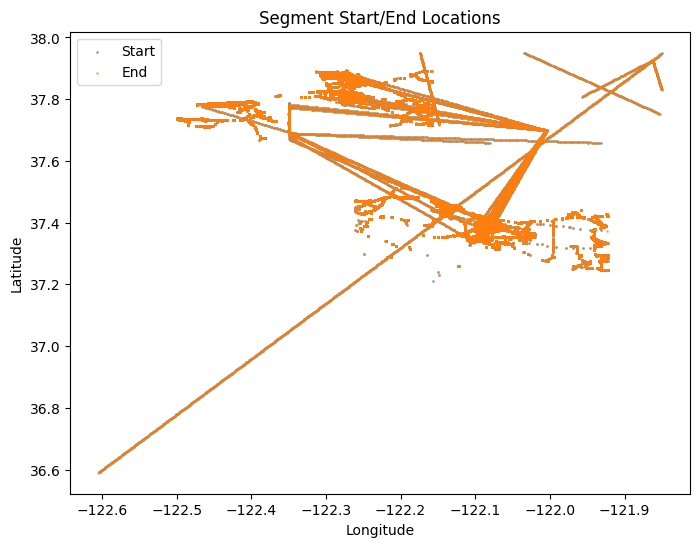


--- Temporal Analysis ---


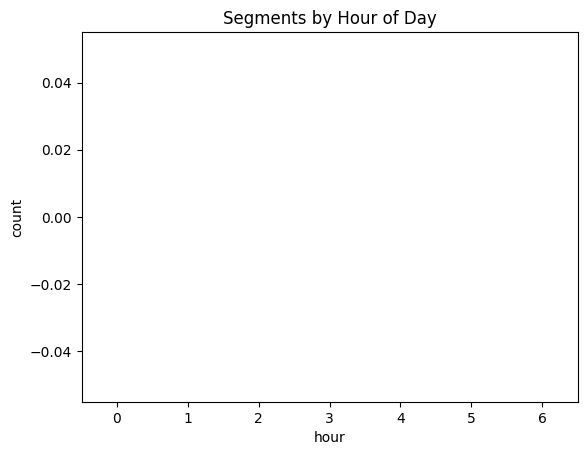


--- Energy & Efficiency ---
                                   count      mean       std           min  \
energy_kwh                       50960.0  0.096432  0.289103  1.211089e-05   
energy_rolling_resistance_kwh    50960.0  0.019621  0.081649  1.177563e-05   
energy_aerodynamic_drag_kwh      50960.0  0.019648  0.050676  0.000000e+00   
energy_elevation_change_kwh      50960.0 -0.000404  0.044762 -3.456023e-01   
energy_acceleration_kwh          50960.0  0.011680  0.024742  0.000000e+00   
energy_regenerative_braking_kwh  50960.0 -0.008619  0.019046 -1.975974e-01   
energy_hvac_kwh                  50960.0  0.016163  0.098228  0.000000e+00   
energy_auxiliary_kwh             50960.0  0.000923  0.005371  2.056672e-07   
energy_battery_thermal_loss_kwh  50960.0  0.000622  0.001277  0.000000e+00   

                                      25%       50%       75%       max  
energy_kwh                       0.012979  0.041535  0.097913  6.450222  
energy_rolling_resistance_kwh    0.003625 

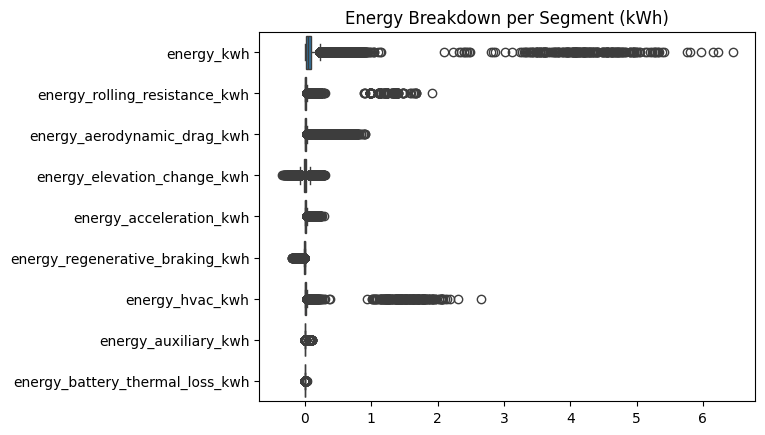


--- Weather & Context ---


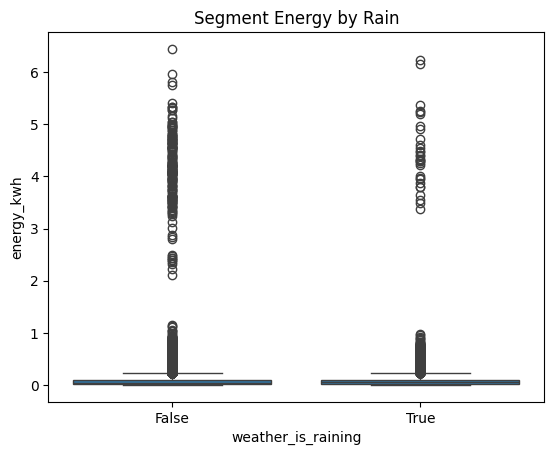


--- Road/Contextual Features ---



--- Outlier & Anomaly Detection ---


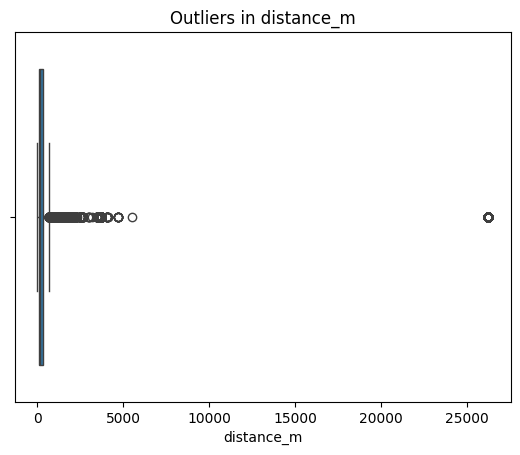

       distance_m             trip_id vehicle_id
126  26250.298752  EV_000_20240101_00     EV_000
264  26255.791172  EV_000_20240101_01     EV_000
457  26244.604202  EV_000_20240101_03     EV_000
627  26248.459734  EV_000_20240101_07     EV_000
892  26248.115263  EV_000_20240101_18     EV_000


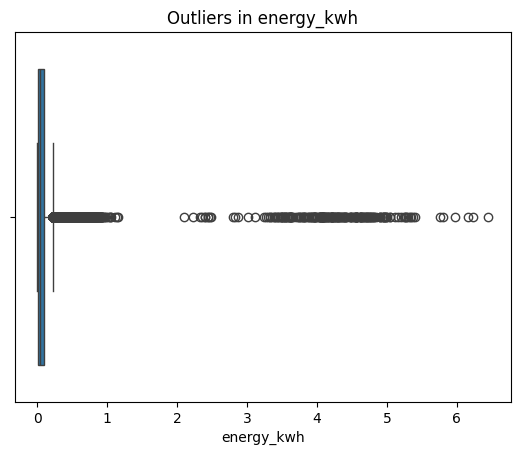

     energy_kwh             trip_id vehicle_id
126    4.090258  EV_000_20240101_00     EV_000
264    3.117221  EV_000_20240101_01     EV_000
457    3.519731  EV_000_20240101_03     EV_000
627    4.038983  EV_000_20240101_07     EV_000
892    3.571110  EV_000_20240101_18     EV_000


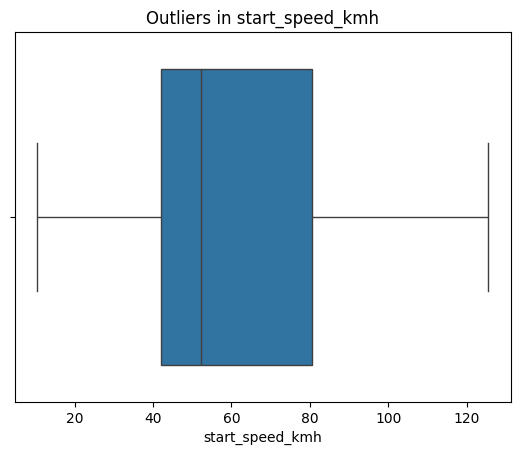

     start_speed_kmh             trip_id vehicle_id
159       124.189779  EV_000_20240101_00     EV_000
245       120.694634  EV_000_20240101_01     EV_000
299       121.471074  EV_000_20240101_01     EV_000
595       124.001778  EV_000_20240101_07     EV_000
818       125.528520  EV_000_20240101_17     EV_000


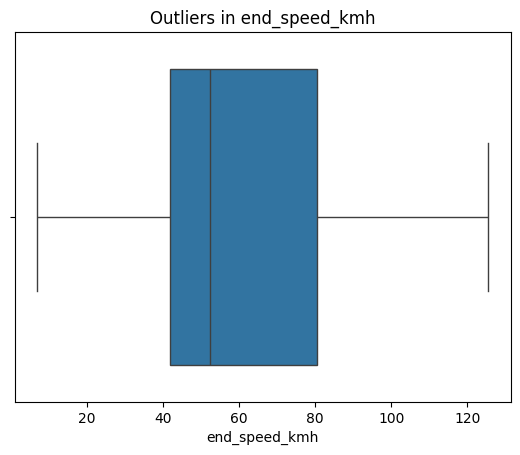

     end_speed_kmh             trip_id vehicle_id
158     124.189779  EV_000_20240101_00     EV_000
244     120.694634  EV_000_20240101_01     EV_000
298     121.471074  EV_000_20240101_01     EV_000
594     124.001778  EV_000_20240101_07     EV_000
817     125.528520  EV_000_20240101_17     EV_000

--- Correlations & Insights ---


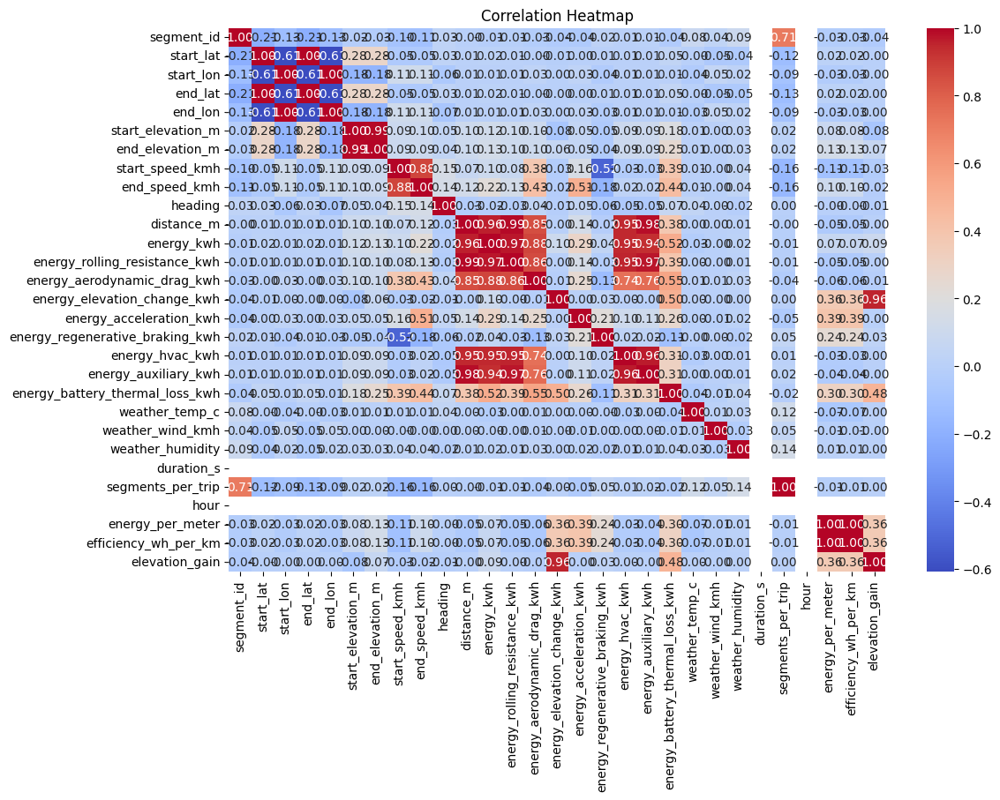


--- Key Findings & Next Steps ---
Summarize key insights from the above analysis.
Suggest further analyses or modeling directions.


In [2]:
# Segment-Level Data EDA Script
# Exploratory Data Analysis for EV Fleet Segment-Level Data (segments.csv)
# ---
# This script provides a comprehensive analysis of the segment-level synthetic data generated for the EV fleet.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# 1. Load Data
segments = pd.read_csv('../data/synthetic/segments.csv')
print(f'Segments shape: {segments.shape}')
print(segments.head())

# 2. Data Overview
print('\n--- Data Overview ---')
print(segments.info())
print('\nMissing values:')
print(segments.isnull().sum())
print(segments.describe(include='all').T)

# 3. Segment Distribution
print('\n--- Segment Distribution ---')
for col in ['start_time', 'end_time']:
    if segments[col].dtype == 'O':
        segments[col] = pd.to_datetime(segments[col],errors='coerce',utc=True,format='ISO08601')
segments['duration_s'] = (segments['end_time'] - segments['start_time']).dt.total_seconds()

fig, axs = plt.subplots(1, 3, figsize=(18, 4))
sns.histplot(segments['distance_m'], bins=50, ax=axs[0], kde=True)
axs[0].set_title('Segment Distance (m)')
axs[0].set_xlim(0, 5000)  
sns.histplot(segments['duration_s'], bins=50, ax=axs[1], kde=True)
axs[1].set_title('Segment Duration (s)')
sns.histplot(segments['energy_kwh'], bins=50, ax=axs[2], kde=True)
axs[2].set_title('Segment Energy (kWh)')
plt.tight_layout()
plt.show()

px.histogram(segments, x='distance_m', nbins=50, title='Segment Distance (m)',range_x=[0, 5000]).show()
px.histogram(segments, x='energy_kwh', nbins=50, title='Segment Energy (kWh)').show()

# 4. Vehicle & Trip Analysis
print('\n--- Vehicle & Trip Analysis ---')
print('Unique vehicles:', segments['vehicle_id'].nunique())
print('Unique trips:', segments['trip_id'].nunique())
segments_per_trip = segments.groupby('trip_id').size()
segments['segments_per_trip'] = segments.groupby('trip_id')['segment_id'].transform('count')
px.histogram(segments_per_trip, nbins=30, title='Segments per Trip').show()

trip_agg = segments.groupby('trip_id').agg({'distance_m':'sum', 'energy_kwh':'sum', 'vehicle_id':'first'})
trip_agg = trip_agg.reset_index()
fig = px.scatter(trip_agg, x='distance_m', y='energy_kwh', color='vehicle_id', title='Trip Distance vs. Energy')
fig.show()

# 5. Spatial Analysis
print('\n--- Spatial Analysis ---')
plt.figure(figsize=(8, 6))
plt.scatter(segments['start_lon'], segments['start_lat'], s=1, alpha=0.5, label='Start')
plt.scatter(segments['end_lon'], segments['end_lat'], s=1, alpha=0.5, label='End')
plt.title('Segment Start/End Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

fig = px.scatter_mapbox(segments.sample(min(1000, len(segments))), lat='start_lat', lon='start_lon',
                        color='energy_kwh', size='distance_m',
                        mapbox_style='carto-positron', zoom=8,
                        title='Segment Start Locations (sample)')
fig.show()

# 6. Temporal Analysis
print('\n--- Temporal Analysis ---')
segments['hour'] = segments['start_time'].dt.hour
segments['weekday'] = segments['start_time'].dt.day_name()
sns.countplot(x='hour', data=segments)
plt.title('Segments by Hour of Day')
plt.show()

px.box(segments, x='hour', y='duration_s', title='Segment Duration by Hour').show()

# 7. Energy & Efficiency
print('\n--- Energy & Efficiency ---')
energy_cols = [col for col in segments.columns if col.startswith('energy_')]
segments['energy_per_meter'] = segments['energy_kwh'] * 1000 / segments['distance_m']
segments['efficiency_wh_per_km'] = segments['energy_kwh'] * 1000 / (segments['distance_m'] / 1000)

print(segments[energy_cols].describe().T)

sns.boxplot(data=segments[energy_cols], orient='h')
plt.title('Energy Breakdown per Segment (kWh)')
plt.show()

px.histogram(segments, x='energy_per_meter', nbins=50, title='Energy per Meter (Wh/m)').show()

# 8. Weather & Context
print('\n--- Weather & Context ---')
if 'weather_temp_c' in segments.columns:
    px.scatter(segments, x='weather_temp_c', y='energy_kwh', trendline='ols',
               title='Segment Energy vs. Temperature').show()
if 'weather_wind_kmh' in segments.columns:
    px.scatter(segments, x='weather_wind_kmh', y='energy_kwh', trendline='ols',
               title='Segment Energy vs. Wind Speed').show()
if 'weather_is_raining' in segments.columns:
    sns.boxplot(x='weather_is_raining', y='energy_kwh', data=segments)
    plt.title('Segment Energy by Rain')
    plt.show()

# 9. Road/Contextual Features
print('\n--- Road/Contextual Features ---')
if 'start_elevation_m' in segments.columns and 'end_elevation_m' in segments.columns:
    segments['elevation_gain'] = segments['end_elevation_m'] - segments['start_elevation_m']
    px.scatter(segments, x='elevation_gain', y='energy_kwh', trendline='ols',
               title='Segment Energy vs. Elevation Gain').show()
if 'is_highway' in segments.columns:
    sns.boxplot(x='is_highway', y='energy_kwh', data=segments)
    plt.title('Segment Energy by Highway')
    plt.show()

# 10. Outlier & Anomaly Detection
print('\n--- Outlier & Anomaly Detection ---')
for col in ['distance_m', 'energy_kwh', 'start_speed_kmh', 'end_speed_kmh']:
    if col in segments.columns:
        sns.boxplot(x=segments[col])
        plt.title(f'Outliers in {col}')
        plt.show()
        print(segments[segments[col] > segments[col].quantile(0.99)][[col, 'trip_id', 'vehicle_id']].head())

# 11. Correlations & Insights
print('\n--- Correlations & Insights ---')
corr = segments.select_dtypes(include=[np.number]).corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

print('\n--- Key Findings & Next Steps ---')
print('Summarize key insights from the above analysis.\nSuggest further analyses or modeling directions.')